# **1. Perkenalan Dataset**


Tahap pertama, Anda harus mencari dan menggunakan dataset **tanpa label** dengan ketentuan sebagai berikut:

1. **Sumber Dataset**:  
   Dataset dapat diperoleh dari berbagai sumber, seperti public repositories (*Kaggle*, *UCI ML Repository*, *Open Data*) atau data primer yang Anda kumpulkan sendiri.
   
2. **Ketentuan Dataset**:
   - **Tanpa label**: Dataset tidak boleh memiliki label atau kelas.
   - **Jumlah Baris**: Minimal 1000 baris untuk memastikan dataset cukup besar untuk analisis yang bermakna.
   - **Tipe Data**: Harus mengandung data **kategorikal** dan **numerikal**.
     - *Kategorikal*: Misalnya jenis kelamin, kategori produk.
     - *Numerikal*: Misalnya usia, pendapatan, harga.

3. **Pembatasan**:  
   Dataset yang sudah digunakan dalam latihan clustering (seperti customer segmentation) tidak boleh digunakan.

**Penjelasan Dataset**:
   
   Dataset yang digunakan adalah "Bank Transaction Dataset for Fraud Detection" dari Kaggle. Dataset ini tidak memiliki label awal, sehingga cocok untuk unsupervised learning. Berikut adalah deskripsi kolomnya:

1. **TransactionID**: ID unik untuk setiap transaksi.

2. **AccountID**: ID unik untuk setiap akun, terkait dengan beberapa transaksi.

3. **TransactionAmount**: Nilai moneter transaksi (numerikal).

4. **TransactionDate**: Tanggal dan waktu transaksi.

5. **TransactionType**: Jenis transaksi, "Credit" atau "Debit" (kategorikal).

6. **Location**: Kota di AS tempat transaksi terjadi (kategorikal).

7. **DeviceID**: ID perangkat yang digunakan untuk transaksi.

8. **IPAddress**: Alamat IPv4 terkait transaksi.

9. **MerchantID**: ID unik pedagang yang terlibat dalam transaksi.

10. **Channel**: Saluran transaksi, misalnya "Online", "ATM", "Branch" (kategorikal).

Dataset ini memiliki lebih dari 1000 baris (dengan asumsi versi penuh dari Kaggle memenuhi syarat >2500 baris), mengandung fitur numerikal (TransactionAmount) dan kategorikal (TransactionType, Location, Channel), serta relevan dengan tema keuangan dan bank fraud.

# **2. Import Library**

Pada tahap ini, Anda perlu mengimpor beberapa pustaka (library) Python yang dibutuhkan untuk analisis data dan pembangunan model machine learning.

In [79]:
%pip install numpy pandas scipy matplotlib seaborn scikit-learn
%pip install kagglehub[pandas-datasets]

# Import library dasar untuk manipulasi dan analisis data
import numpy as np
import pandas as pd

# Import library untuk visualisasi
import matplotlib.pyplot as plt
import seaborn as sns

# Import library untuk preprocessing
from sklearn.preprocessing import RobustScaler, LabelEncoder, PowerTransformer, QuantileTransformer
from scipy.stats.mstats import winsorize
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Import library untuk clustering
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, FeatureAgglomeration
from sklearn.metrics import silhouette_score

# Import library untuk feature selection (opsional)
from sklearn.feature_selection import VarianceThreshold

# Library untuk berinteraksi dengan datasets dari kaggle
import kagglehub

# Library untuk melakukan operasi menggunakan sistem operasi
import os

# Mengatur tampilan visualisasi
%matplotlib inline
sns.set_style("whitegrid")

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# **3. Memuat Dataset**

Pada tahap ini, Anda perlu memuat dataset ke dalam notebook. Jika dataset dalam format CSV, Anda bisa menggunakan pustaka pandas untuk membacanya. Pastikan untuk mengecek beberapa baris awal dataset untuk memahami strukturnya dan memastikan data telah dimuat dengan benar.

Jika dataset berada di Google Drive, pastikan Anda menghubungkan Google Drive ke Colab terlebih dahulu. Setelah dataset berhasil dimuat, langkah berikutnya adalah memeriksa kesesuaian data dan siap untuk dianalisis lebih lanjut.

In [80]:
# Download dataset
path = kagglehub.dataset_download("valakhorasani/bank-transaction-dataset-for-fraud-detection")
print("Path to dataset files:", path)

# Memuat dataset
csv_file = os.path.join(path, "bank_transactions_data_2.csv")

# Muat ke DataFrame
df = pd.read_csv(csv_file)

# Simpan ke file CSV baru (opsional)
output_path = "bank_transaction_dataset.csv"
df.to_csv(output_path, index=False)
print(f"Dataset disimpan ke: {output_path}")

Path to dataset files: C:\Users\KillerKing\.cache\kagglehub\datasets\valakhorasani\bank-transaction-dataset-for-fraud-detection\versions\4
Dataset disimpan ke: bank_transaction_dataset.csv


In [81]:
# Memuat dataset dari file CSV (diasumsikan sudah diunduh dari Kaggle)
data = pd.read_csv('bank_transaction_dataset.csv')

# Menampilkan 5 baris pertama dataset
print("5 Baris Pertama Dataset:")
print(data.head())

# Menampilkan informasi dasar dataset
print("\nInformasi Dataset:")
print(data.info())

# Memeriksa jumlah baris dan kolom
print("\nJumlah Baris dan Kolom:", data.shape)

5 Baris Pertama Dataset:
  TransactionID AccountID  TransactionAmount      TransactionDate  \
0      TX000001   AC00128              14.09  2023-04-11 16:29:14   
1      TX000002   AC00455             376.24  2023-06-27 16:44:19   
2      TX000003   AC00019             126.29  2023-07-10 18:16:08   
3      TX000004   AC00070             184.50  2023-05-05 16:32:11   
4      TX000005   AC00411              13.45  2023-10-16 17:51:24   

  TransactionType   Location DeviceID      IP Address MerchantID Channel  \
0           Debit  San Diego  D000380  162.198.218.92       M015     ATM   
1           Debit    Houston  D000051     13.149.61.4       M052     ATM   
2           Debit       Mesa  D000235  215.97.143.157       M009  Online   
3           Debit    Raleigh  D000187  200.13.225.150       M002  Online   
4          Credit    Atlanta  D000308    65.164.3.100       M091  Online   

   CustomerAge CustomerOccupation  TransactionDuration  LoginAttempts  \
0           70             Doc

# **4. Exploratory Data Analysis (EDA)**

Pada tahap ini, Anda akan melakukan **Exploratory Data Analysis (EDA)** untuk memahami karakteristik dataset. EDA bertujuan untuk:

1. **Memahami Struktur Data**
   - Tinjau jumlah baris dan kolom dalam dataset.  
   - Tinjau jenis data di setiap kolom (numerikal atau kategorikal).

2. **Menangani Data yang Hilang**  
   - Identifikasi dan analisis data yang hilang (*missing values*). Tentukan langkah-langkah yang diperlukan untuk menangani data yang hilang, seperti pengisian atau penghapusan data tersebut.

3. **Analisis Distribusi dan Korelasi**  
   - Analisis distribusi variabel numerik dengan statistik deskriptif dan visualisasi seperti histogram atau boxplot.  
   - Periksa hubungan antara variabel menggunakan matriks korelasi atau scatter plot.

4. **Visualisasi Data**  
   - Buat visualisasi dasar seperti grafik distribusi dan diagram batang untuk variabel kategorikal.  
   - Gunakan heatmap atau pairplot untuk menganalisis korelasi antar variabel.

Tujuan dari EDA adalah untuk memperoleh wawasan awal yang mendalam mengenai data dan menentukan langkah selanjutnya dalam analisis atau pemodelan.

Statistik Deskriptif untuk Kolom Numerikal:
       TransactionAmount  CustomerAge  TransactionDuration  LoginAttempts  \
count        2512.000000  2512.000000          2512.000000    2512.000000   
mean          297.593778    44.673965           119.643312       1.124602   
std           291.946243    17.792198            69.963757       0.602662   
min             0.260000    18.000000            10.000000       1.000000   
25%            81.885000    27.000000            63.000000       1.000000   
50%           211.140000    45.000000           112.500000       1.000000   
75%           414.527500    59.000000           161.000000       1.000000   
max          1919.110000    80.000000           300.000000       5.000000   

       AccountBalance  
count     2512.000000  
mean      5114.302966  
std       3900.942499  
min        101.250000  
25%       1504.370000  
50%       4735.510000  
75%       7678.820000  
max      14977.990000  

Statistik Deskriptif untuk Kolom Kategorikal:



Jumlah Missing Values per Kolom:
TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
AccountBalance             0
PreviousTransactionDate    0
dtype: int64


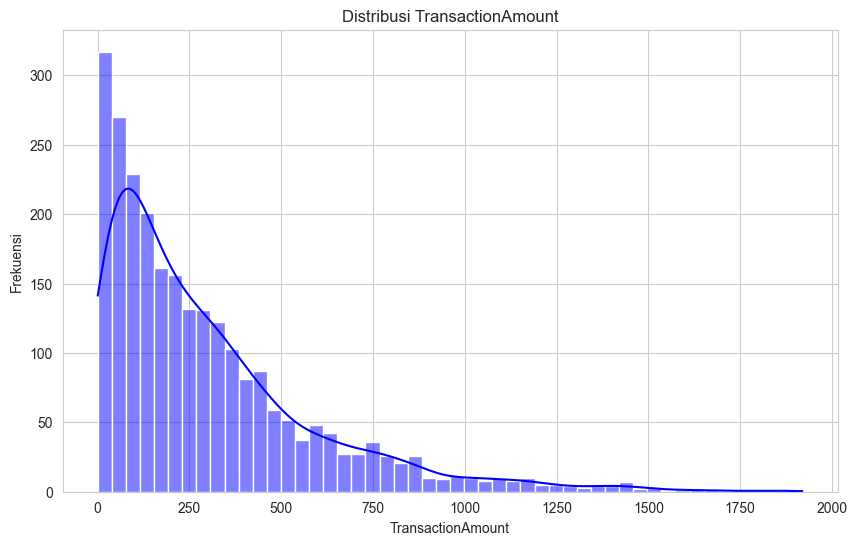

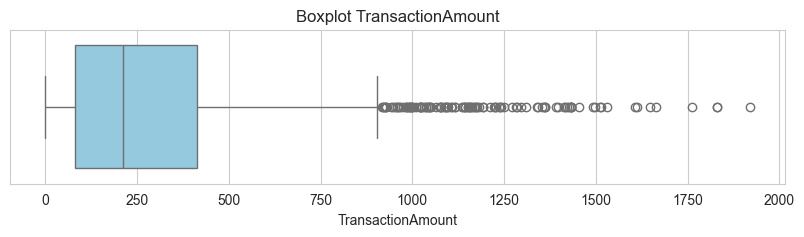

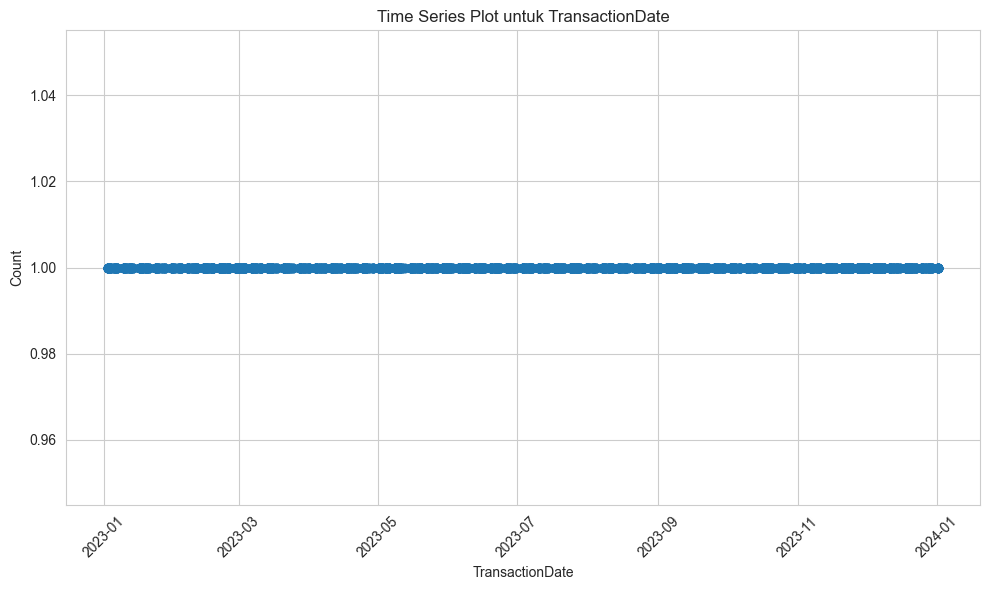

C:\Users\KillerKing\AppData\Local\Temp\ipykernel_18704\1009555763.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=data, palette='viridis')


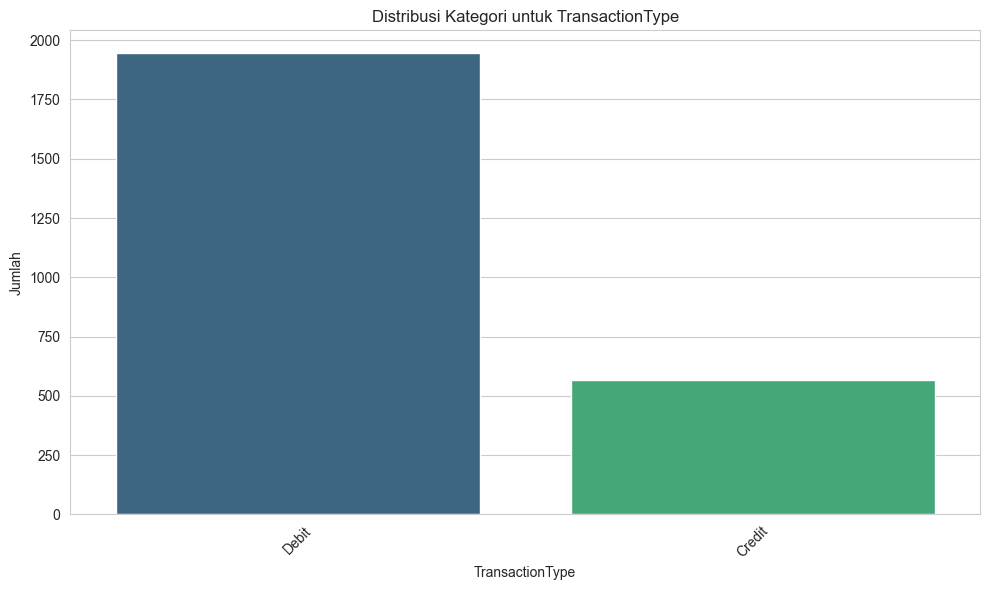

C:\Users\KillerKing\AppData\Local\Temp\ipykernel_18704\1009555763.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=data, palette='viridis')


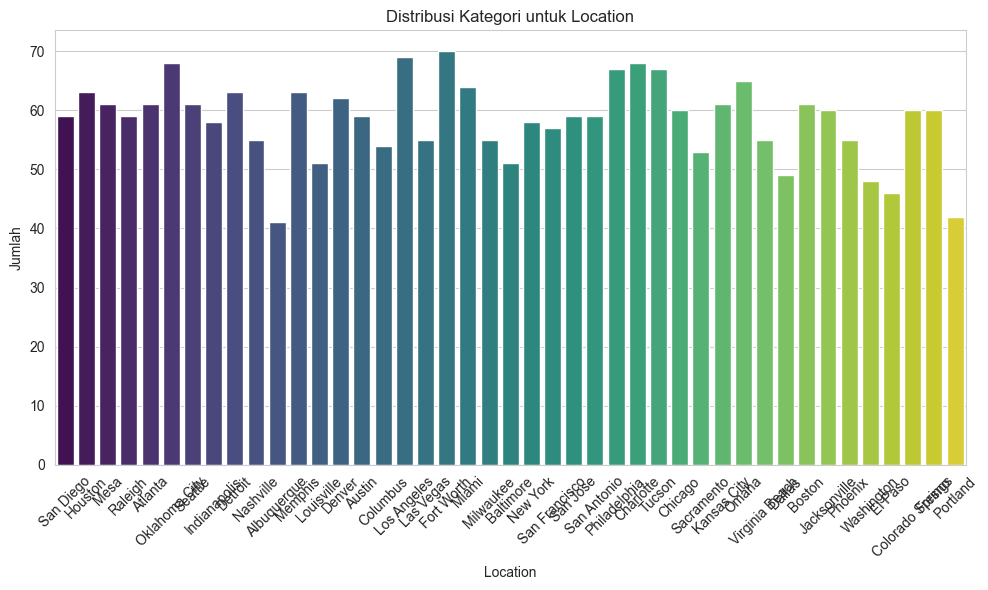

C:\Users\KillerKing\AppData\Local\Temp\ipykernel_18704\1009555763.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=data, palette='viridis')


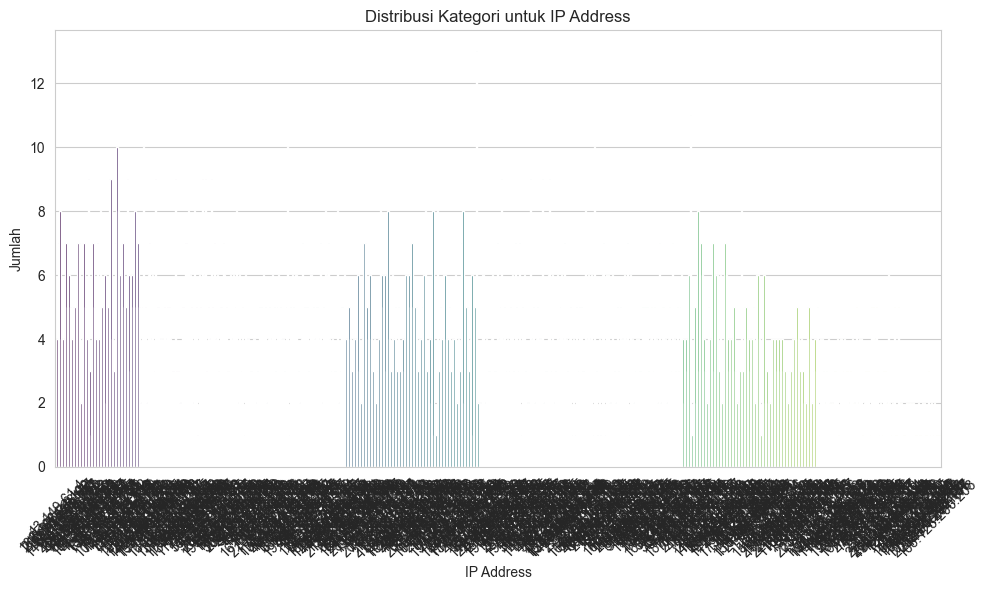

C:\Users\KillerKing\AppData\Local\Temp\ipykernel_18704\1009555763.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=data, palette='viridis')


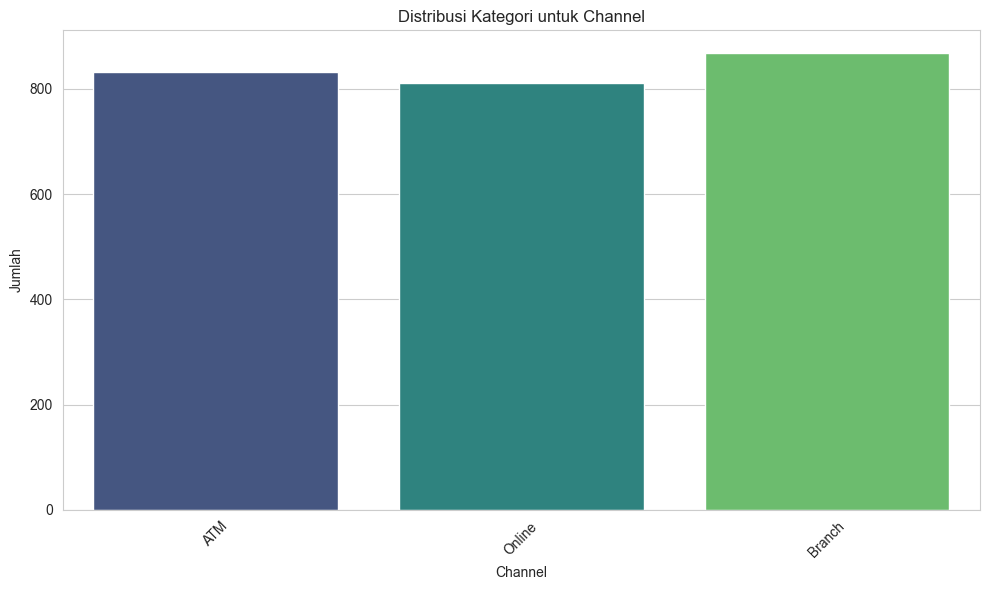

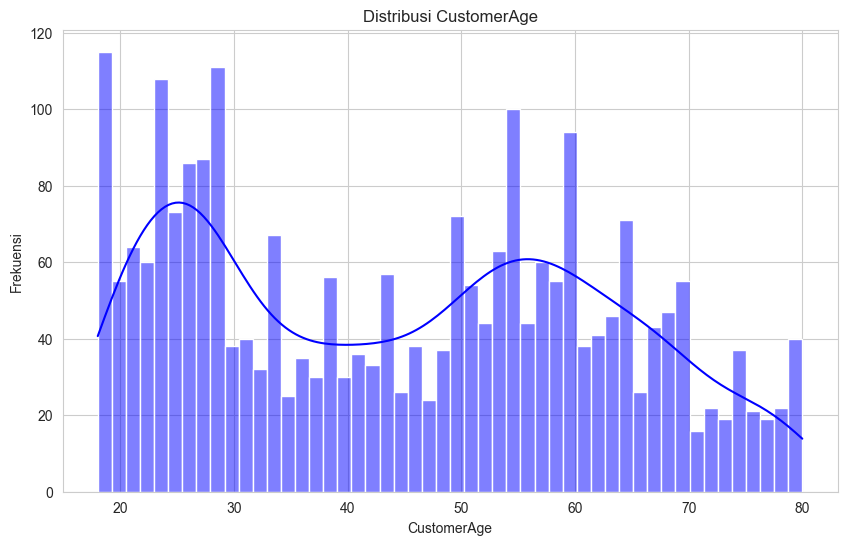

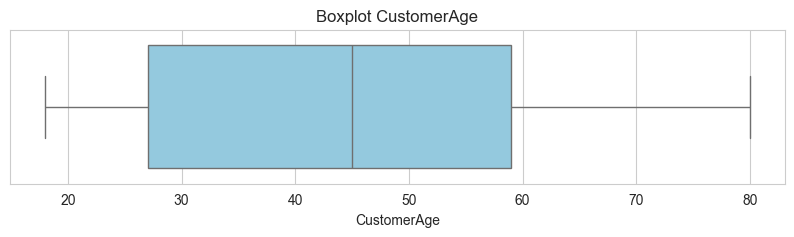

C:\Users\KillerKing\AppData\Local\Temp\ipykernel_18704\1009555763.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=data, palette='viridis')


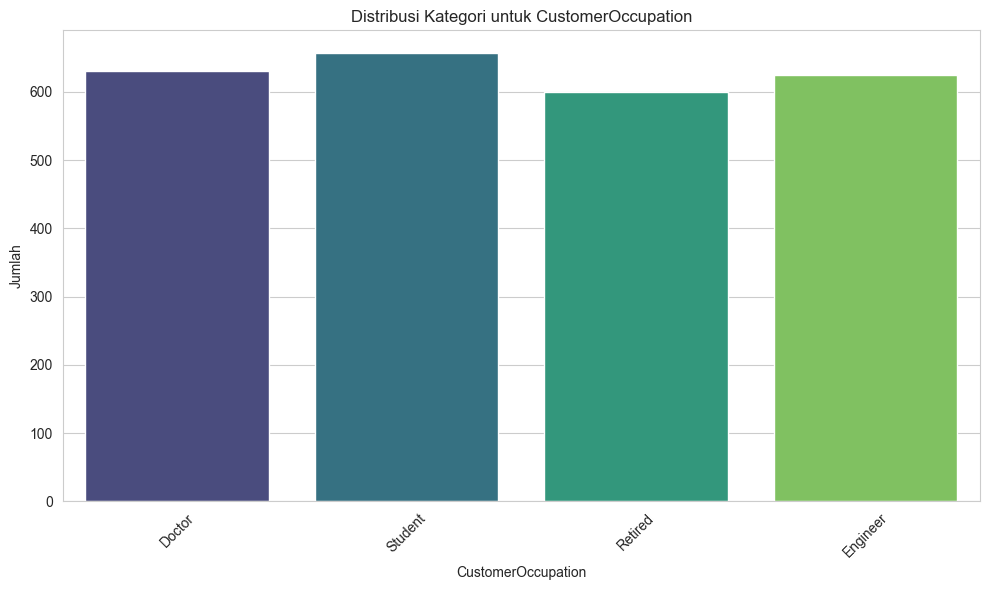

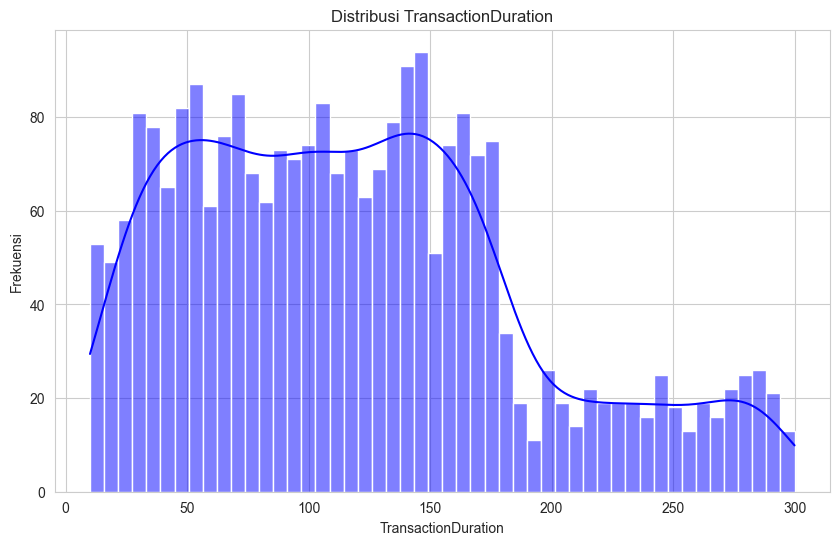

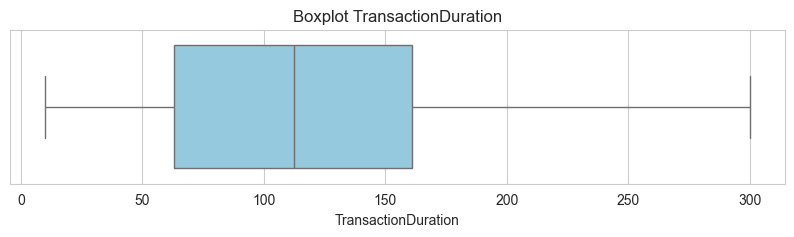

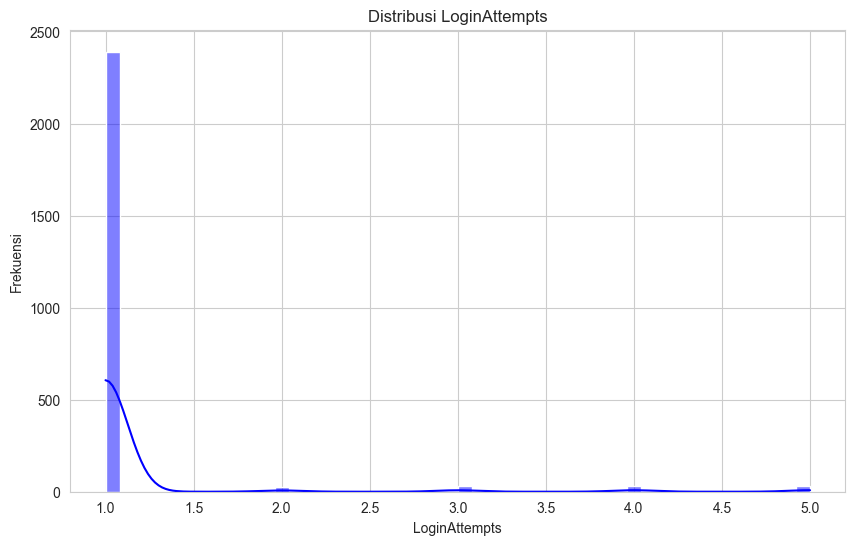

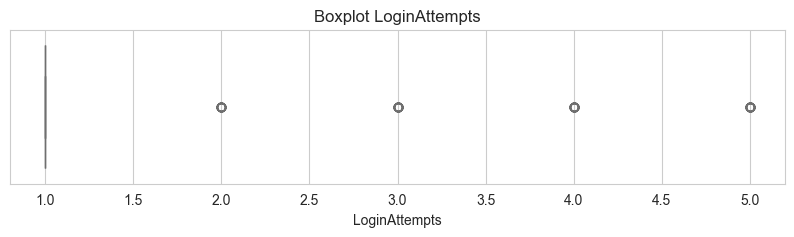

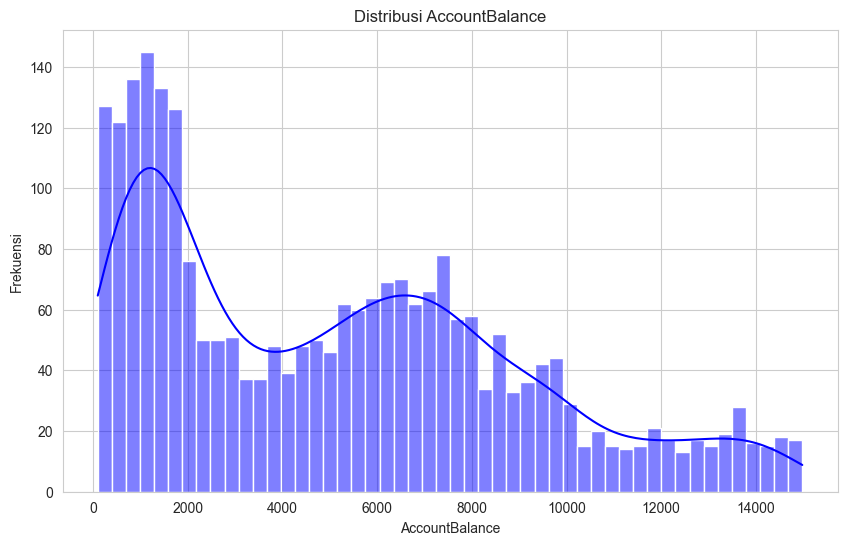

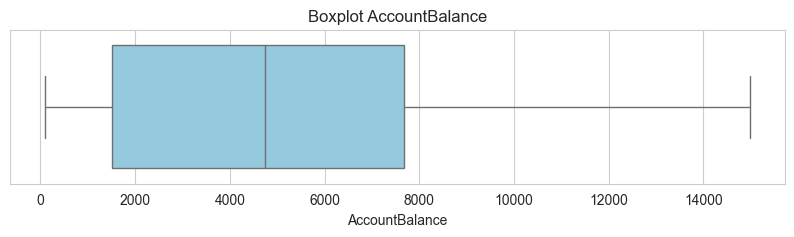

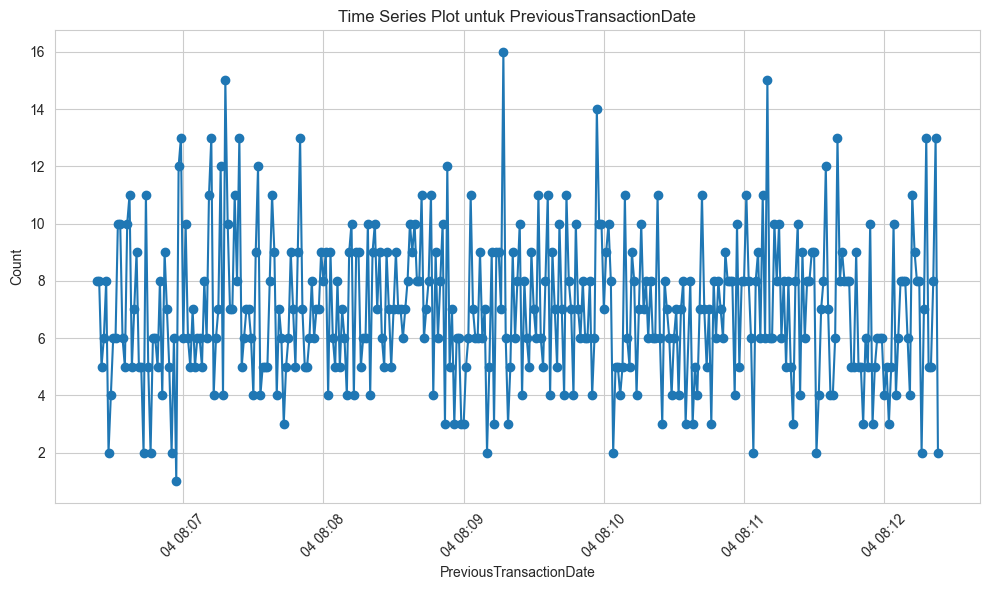

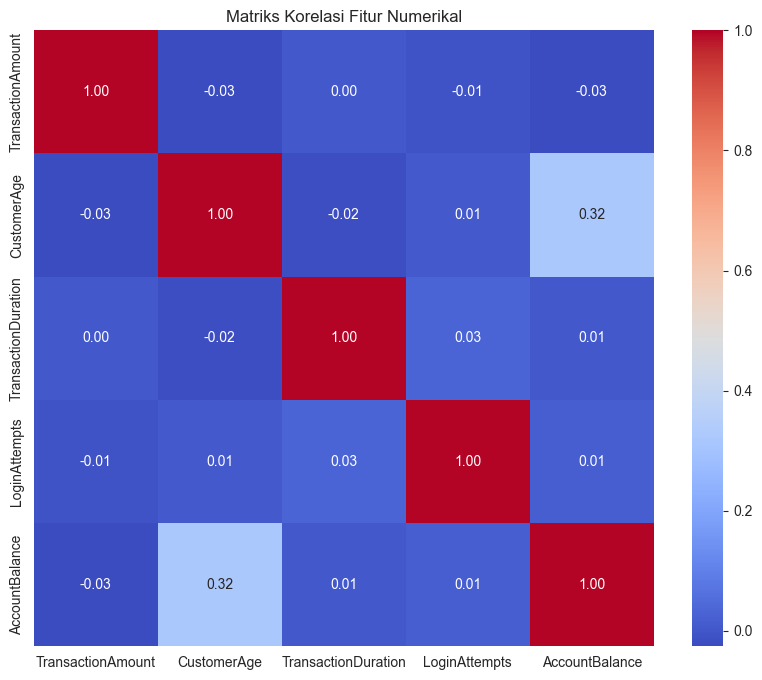

In [82]:
# Asumsikan data sudah tersedia sebagai variabel 'data'

# 1. Statistik Deskriptif
print("Statistik Deskriptif untuk Kolom Numerikal:")
print(data.describe())

print("\nStatistik Deskriptif untuk Kolom Kategorikal:")
print(data.describe(include=['object']))

# 2. Pemeriksaan Missing Values
print("\nJumlah Missing Values per Kolom:")
print(data.isnull().sum())

# 3. Visualisasi untuk Setiap Kolom (kecuali kolom yang berakhiran 'id')
for col in data.columns:
    # Lewati kolom dengan akhiran 'id' (case-insensitive)
    if col.lower().endswith('id'):
        continue

    # Jika kolom merupakan tanggal (deteksi dari nama atau tipe data)
    if ('date' in col.lower()) or pd.api.types.is_datetime64_any_dtype(data[col]):
        # Pastikan kolom bertipe datetime; jika belum, konversi terlebih dahulu
        if not pd.api.types.is_datetime64_any_dtype(data[col]):
            data[col] = pd.to_datetime(data[col], errors='coerce')
        
        # Buat agregasi frekuensi per tanggal (misal: hitung jumlah baris per tanggal)
        timeseries = data.groupby(col).size().reset_index(name='Count')
        
        plt.figure(figsize=(10, 6))
        plt.plot(timeseries[col], timeseries['Count'], marker='o', linestyle='-')
        plt.title(f'Time Series Plot untuk {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    elif data[col].dtype in ['int64', 'float64']:
        # Visualisasi untuk kolom numerikal
        plt.figure(figsize=(10, 6))
        sns.histplot(data[col], bins=50, kde=True, color='blue')
        plt.title(f'Distribusi {col}')
        plt.xlabel(col)
        plt.ylabel('Frekuensi')
        plt.show()
        
        plt.figure(figsize=(10, 2))
        sns.boxplot(x=data[col], color='skyblue')
        plt.title(f'Boxplot {col}')
        plt.xlabel(col)
        plt.show()
    else:
        # Visualisasi untuk kolom kategorikal
        plt.figure(figsize=(10, 6))
        sns.countplot(x=col, data=data, palette='viridis')
        plt.title(f'Distribusi Kategori untuk {col}')
        plt.xlabel(col)
        plt.ylabel('Jumlah')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# 4. Visualisasi Korelasi Antar Fitur Numerikal (jika ada lebih dari satu)
numeric_cols = data.select_dtypes(include=np.number).columns
if len(numeric_cols) > 1:
    plt.figure(figsize=(10, 8))
    sns.heatmap(data[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Matriks Korelasi Fitur Numerikal')
    plt.show()



# **5. Data Preprocessing**

Pada tahap ini, data preprocessing adalah langkah penting untuk memastikan kualitas data sebelum digunakan dalam model machine learning. Data mentah sering kali mengandung nilai kosong, duplikasi, atau rentang nilai yang tidak konsisten, yang dapat memengaruhi kinerja model. Oleh karena itu, proses ini bertujuan untuk membersihkan dan mempersiapkan data agar analisis berjalan optimal.

Berikut adalah tahapan-tahapan yang bisa dilakukan, tetapi **tidak terbatas** pada:
1. Menghapus atau Menangani Data Kosong (Missing Values)
2. Menghapus Data Duplikat
3. Normalisasi atau Standarisasi Fitur
4. Deteksi dan Penanganan Outlier
5. Encoding Data Kategorikal
6. Binning (Pengelompokan Data)

Cukup sesuaikan dengan karakteristik data yang kamu gunakan yah.

Jumlah data kosong sebelum penanganan:
TransactionID          0
AccountID              0
TransactionAmount      0
TransactionType        0
Location               0
DeviceID               0
MerchantID             0
Channel                0
CustomerAge            0
CustomerOccupation     0
TransactionDuration    0
LoginAttempts          0
AccountBalance         0
TransactionGap         0
IP1                    0
IP2                    0
IP3                    0
IP4                    0
dtype: int64

Jumlah data kosong setelah penanganan:
TransactionID          0
AccountID              0
TransactionAmount      0
TransactionType        0
Location               0
DeviceID               0
MerchantID             0
Channel                0
CustomerAge            0
CustomerOccupation     0
TransactionDuration    0
LoginAttempts          0
AccountBalance         0
TransactionGap         0
IP1                    0
IP2                    0
IP3                    0
IP4                    0
dtype: i

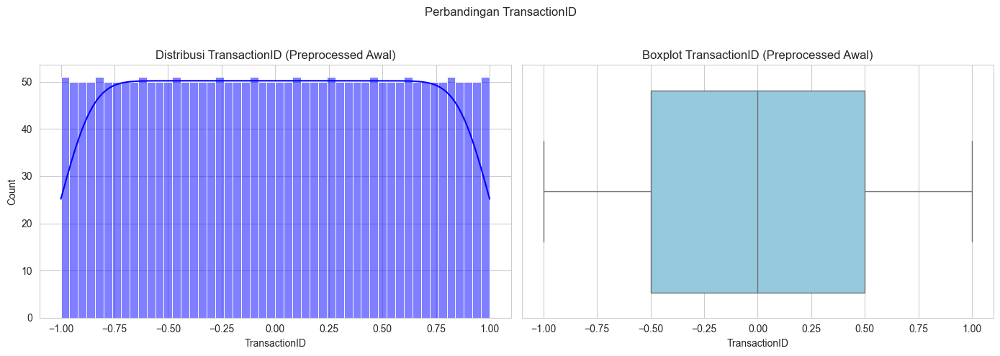

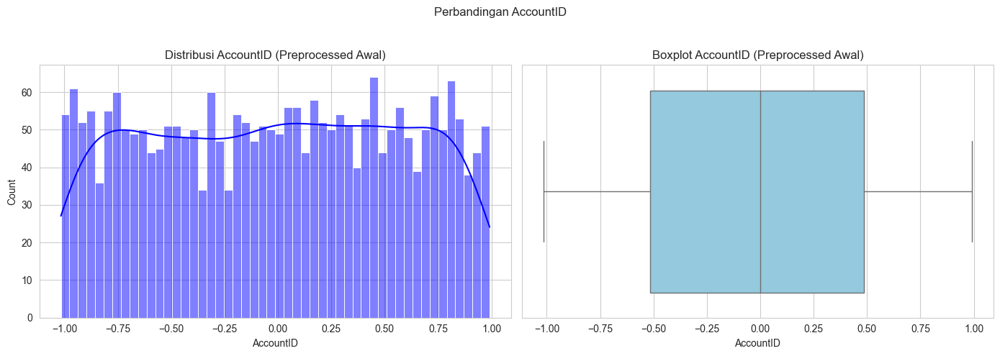

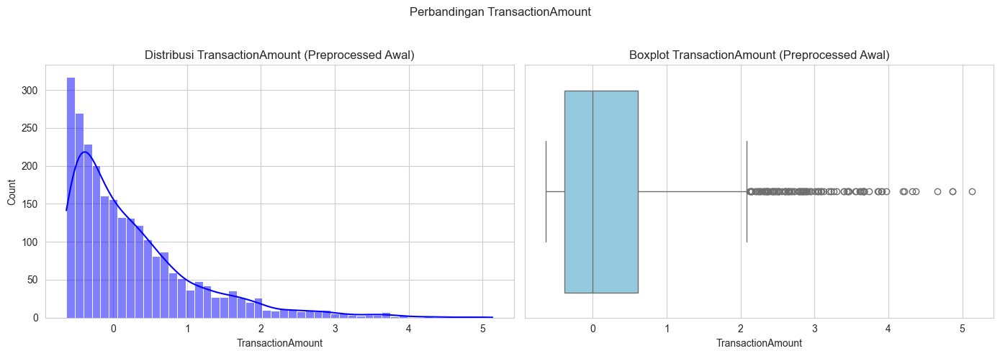

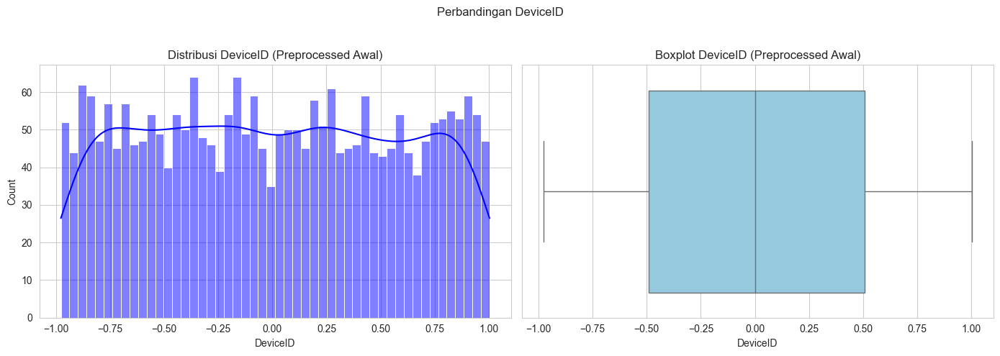

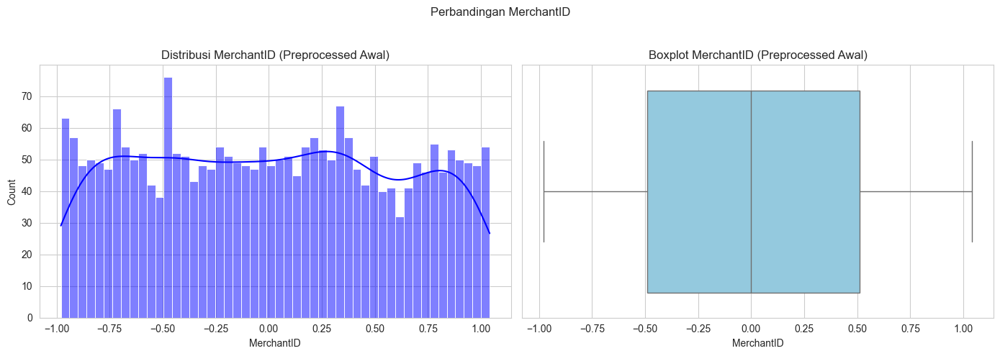

...

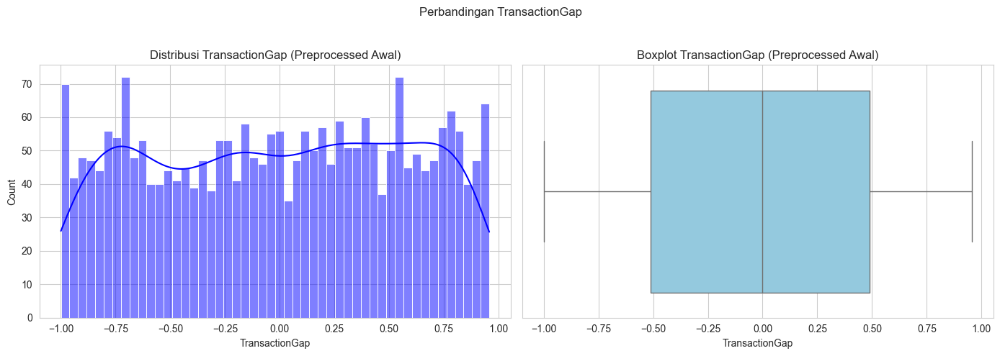

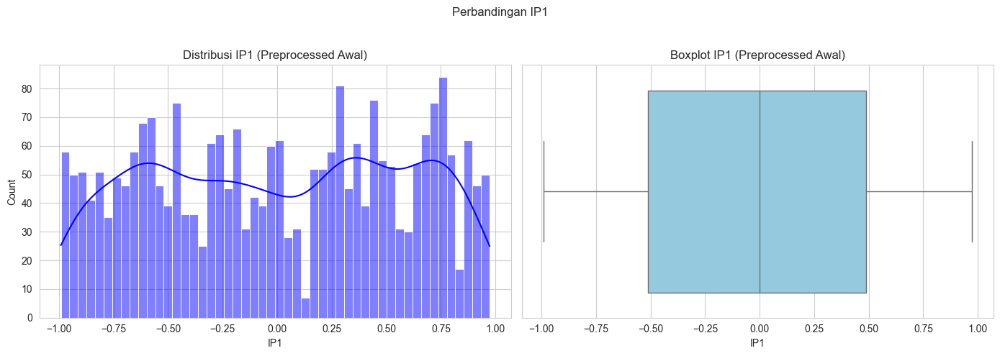

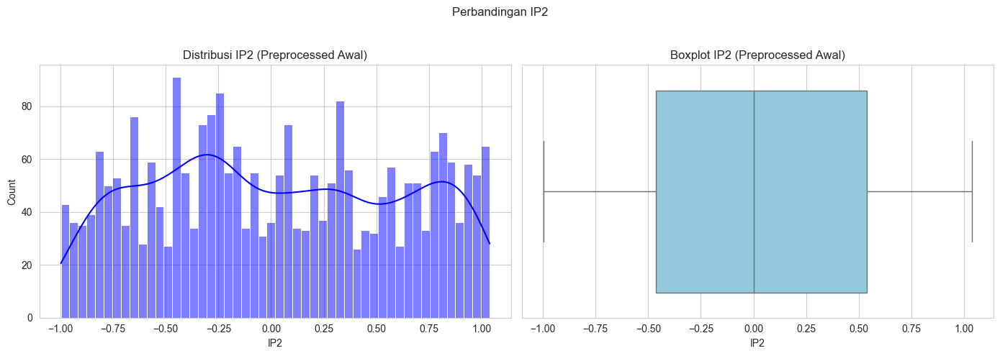

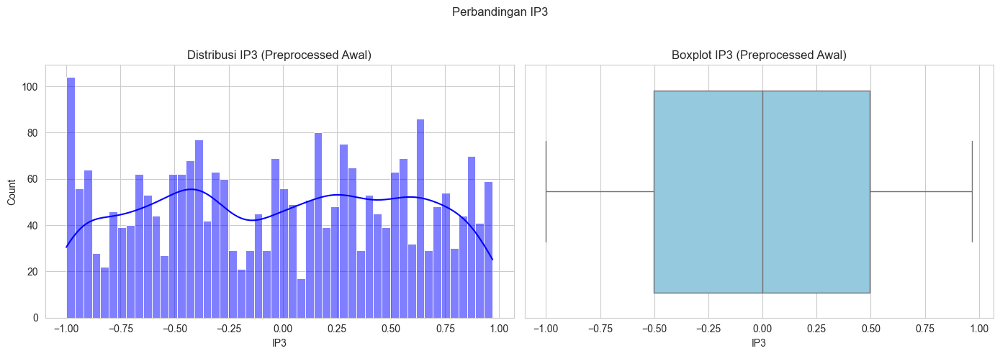

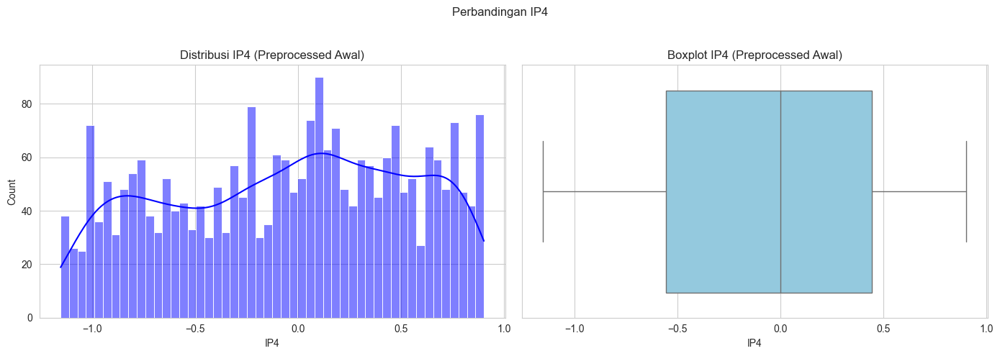


Kolom: TransactionID (skewness asli: 0.00)
Kolom TransactionID tidak memerlukan transformasi (skewness: 0.00)

Kolom: AccountID (skewness asli: -0.02)
Kolom AccountID tidak memerlukan transformasi (skewness: -0.02)

Kolom: TransactionAmount (skewness asli: 1.74)
Kolom TransactionAmount dianggap penting untuk fraud detection, transformasi dilewati.

Kolom: DeviceID (skewness asli: 0.02)
Kolom DeviceID tidak memerlukan transformasi (skewness: 0.02)

Kolom: MerchantID (skewness asli: 0.04)
Kolom MerchantID tidak memerlukan transformasi (skewness: 0.04)

Kolom: Channel (skewness asli: 0.02)
Kolom Channel tidak memerlukan transformasi (skewness: 0.02)

Kolom: CustomerAge (skewness asli: 0.15)
Kolom CustomerAge tidak memerlukan transformasi (skewness: 0.15)

Kolom: TransactionDuration (skewness asli: 0.60)
Yeo-Johnson menghasilkan skewness: -0.08
Setelah transformasi Yeo-Johnson, skewness: -0.08
Kolom TransactionDuration dipilih hasil transformasi Yeo-Johnson dengan skewness: -0.08

Kolom: 

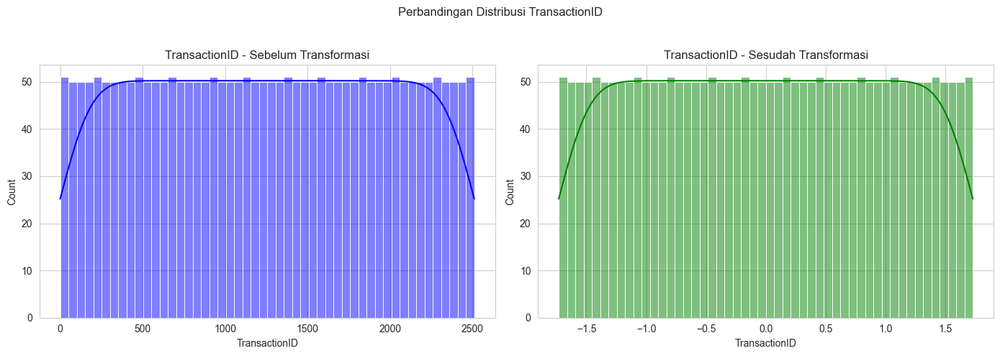

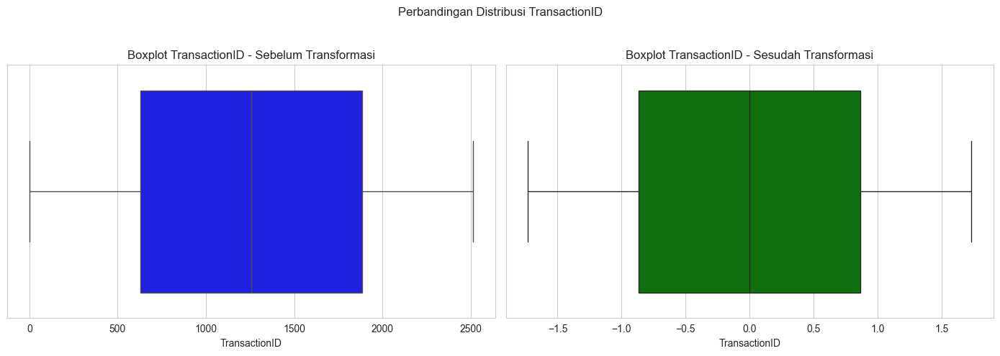

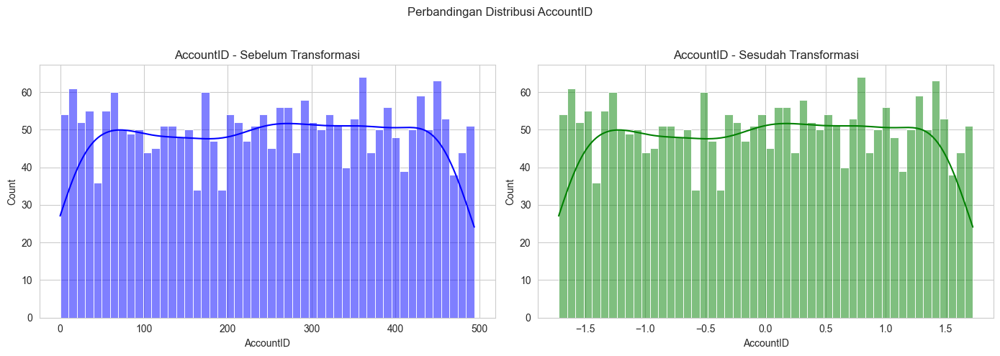

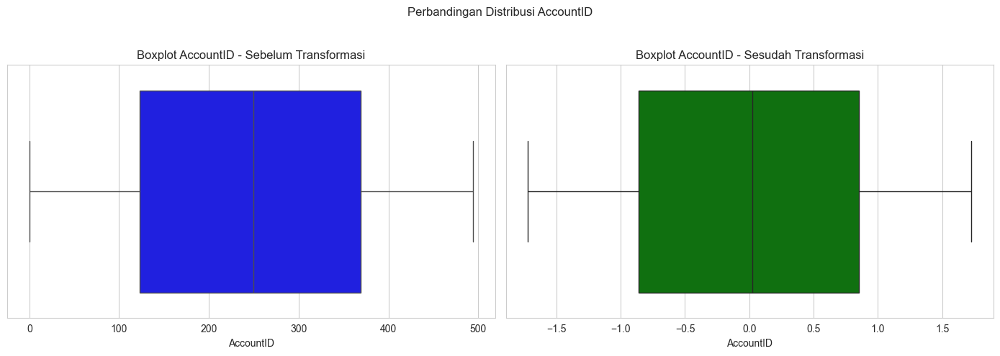

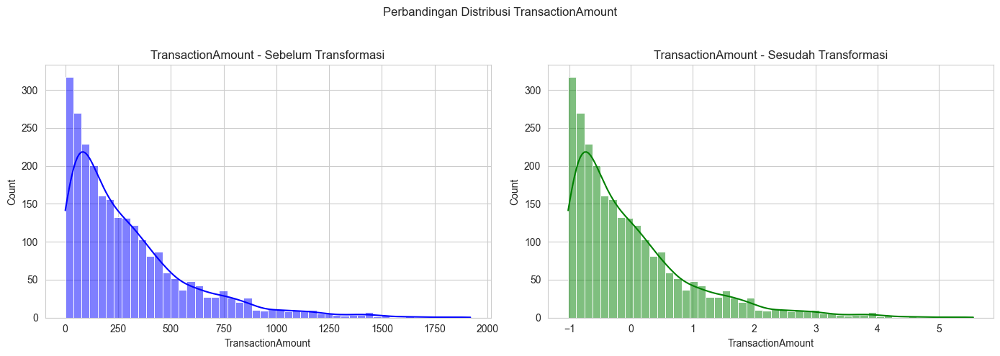

...

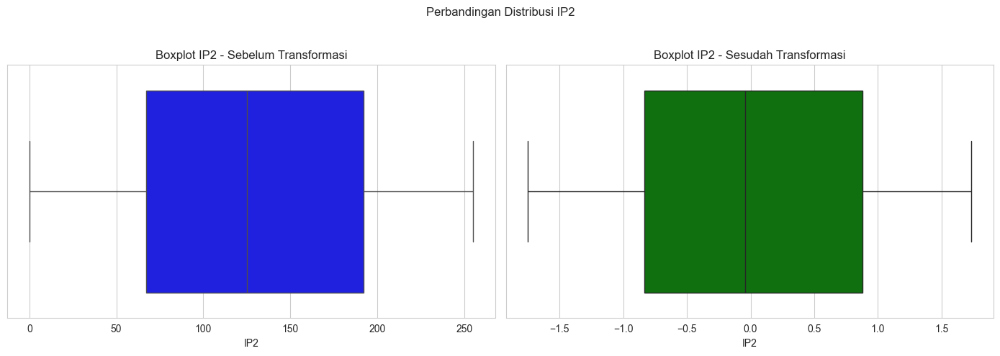

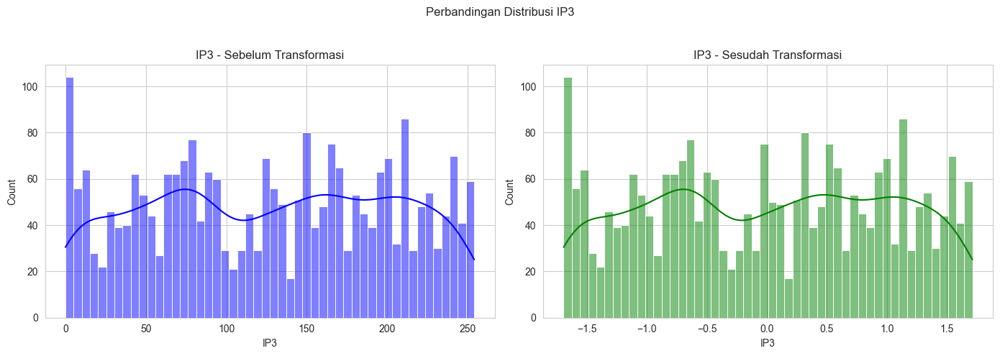

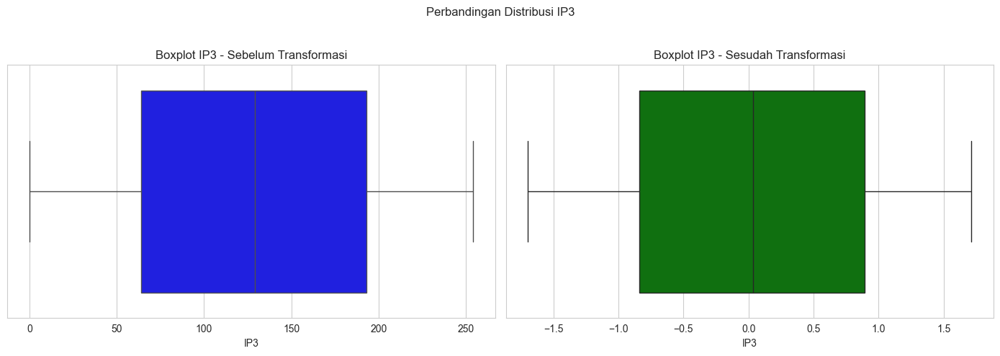

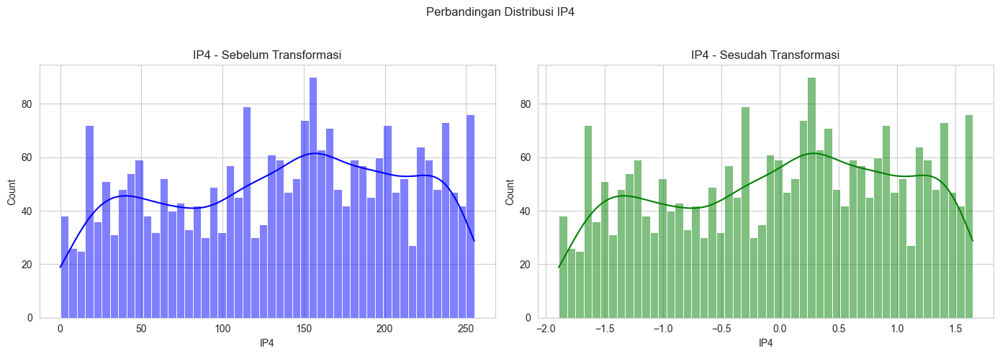

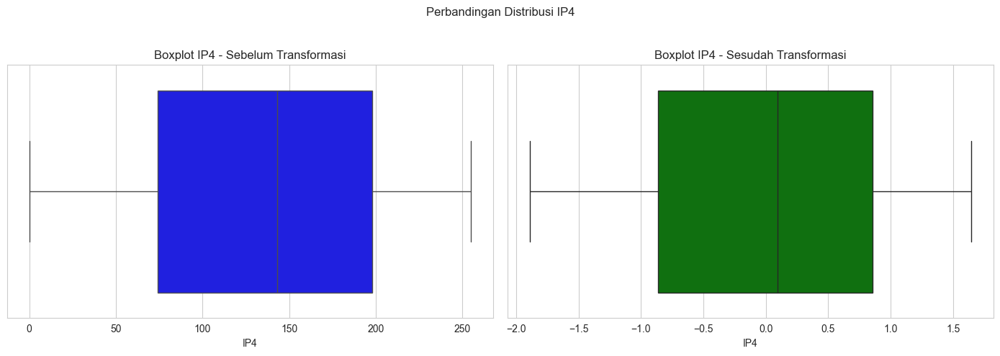


Statistik kolom numerikal setelah perbaikan:
       TransactionID     AccountID  TransactionAmount      DeviceID  \
count    2512.000000  2.512000e+03       2.512000e+03  2.512000e+03   
mean        0.000000  3.394312e-17      -1.414297e-16  9.405074e-17   
std         1.000199  1.000199e+00       1.000199e+00  1.000199e+00   
min        -1.731361 -1.720830e+00      -1.018657e+00 -1.704248e+00   
25%        -0.865681 -8.626399e-01      -7.390118e-01 -8.628038e-01   
50%         0.000000  2.345902e-02      -2.961881e-01 -1.126744e-02   
75%         0.865681  8.537407e-01       4.006114e-01  8.692843e-01   
max         1.731361  1.725885e+00       5.555266e+00  1.727128e+00   

         MerchantID       Channel   CustomerAge  TransactionDuration  \
count  2.512000e+03  2.512000e+03  2.512000e+03         2.512000e+03   
mean  -5.445043e-17 -4.030746e-17  9.900078e-18        -2.828594e-18   
std    1.000199e+00  1.000199e+00  1.000199e+00         1.000199e+00   
min   -1.671699e+00 -1.225

In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, RobustScaler, StandardScaler, PowerTransformer, QuantileTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from scipy.stats import boxcox

# Atur seed untuk konsistensi
np.random.seed(42)

# --- 1. PREPROCESSING AWAL (Menggunakan data original) ---

# Contoh: Memuat data
# data = pd.read_csv('your_data.csv')

# --- Penanganan Khusus untuk Kolom Date ---
if 'TransactionDate' in data.columns and 'PreviousTransactionDate' in data.columns:
    data['TransactionDate'] = pd.to_datetime(data['TransactionDate'], errors='coerce')
    data['PreviousTransactionDate'] = pd.to_datetime(data['PreviousTransactionDate'], errors='coerce')
    data['TransactionGap'] = (data['TransactionDate'] - data['PreviousTransactionDate']).dt.total_seconds()
    data.drop(['TransactionDate', 'PreviousTransactionDate'], axis=1, inplace=True)

date_cols = [col for col in data.columns if 'date' in col.lower()]
for col in date_cols:
    data[col] = pd.to_datetime(data[col], errors='coerce')
    data[f'{col}_year']   = data[col].dt.year
    data[f'{col}_month']  = data[col].dt.month
    data[f'{col}_day']    = data[col].dt.day
    data[f'{col}_hour']   = data[col].dt.hour
    data[f'{col}_minute'] = data[col].dt.minute
    data[f'{col}_second'] = data[col].dt.second
    data.drop(col, axis=1, inplace=True)

# --- Penanganan Khusus untuk Kolom IP Address ---
if 'IP Address' in data.columns:
    ip_split = data['IP Address'].str.split('.', expand=True)
    ip_split.columns = ['IP1', 'IP2', 'IP3', 'IP4']
    for col in ip_split.columns:
        ip_split[col] = pd.to_numeric(ip_split[col], errors='coerce')
    data.drop('IP Address', axis=1, inplace=True)
    data = pd.concat([data, ip_split], axis=1)

# Salin data untuk preprocessing awal
data_original = data.copy()

print("Jumlah data kosong sebelum penanganan:")
print(data_original.isnull().sum())

# Tangani missing values
for col in data_original.columns:
    if data_original[col].dtype == 'object':
        data_original[col] = data_original[col].fillna(data_original[col].mode()[0])
    else:
        data_original[col] = data_original[col].fillna(data_original[col].median())

print("\nJumlah data kosong setelah penanganan:")
print(data_original.isnull().sum())

# Ubah kolom TransactionType menjadi one hot encoding (jika ada)
if 'TransactionType' in data_original.columns:
    data_original = pd.get_dummies(data_original, columns=['TransactionType'], drop_first=True)

# Daftar kolom yang nantinya akan menggunakan label encoding reversibel
cols_to_label = ['Location', 'CustomerOccupation', 'channel']

# Encoding untuk kolom kategorikal selain kolom-kolom di atas
label_encoders = {}
categorical_cols = [col for col in data_original.select_dtypes(include=['object']).columns if col not in cols_to_label]
for col in categorical_cols:
    le = LabelEncoder()
    data_original[col] = le.fit_transform(data_original[col])
    label_encoders[col] = le

# Gunakan RobustScaler untuk mengurangi pengaruh outlier pada scaling (namun outlier akan tetap ada)
numeric_cols = data_original.select_dtypes(include=['float64', 'int64']).columns
data_pre_improve = data_original.copy()
# RobustScaler di sini hanya untuk mengurangi dampak skala yang sangat berbeda,
# namun kita tidak akan menghilangkan atau mengubah distribusi outlier melalui transformasi selanjutnya.
scaler = RobustScaler()
data_pre_improve[numeric_cols] = scaler.fit_transform(data_pre_improve[numeric_cols])
print("\nContoh data pre-improve:")
print(data_pre_improve.head())

# Visualisasi distribusi awal (opsional)
for col in numeric_cols:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.histplot(data_pre_improve[col], bins=50, kde=True, ax=axes[0], color='blue')
    axes[0].set_title(f'Distribusi {col} (Preprocessed Awal)')
    sns.boxplot(x=data_pre_improve[col], ax=axes[1], color='skyblue')
    axes[1].set_title(f'Boxplot {col} (Preprocessed Awal)')
    plt.suptitle(f'Perbandingan {col}')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# --- 2. PERBAIKAN DISTRIBUSI & REDUKSI SKEWNESS ---

# Mulai dari data asli (sebelum transformasi skewness)
data_improve = data_original.copy()
data_before_skew = data_improve.copy()  # backup

# Daftar kolom yang dianggap penting dalam fraud detection dan ingin dipertahankan distribusinya (outlier dianggap sinyal)
cols_keep_outliers = ['TransactionAmount', 'AccountBalance']

# Fungsi untuk mencoba beberapa metode transformasi pada seri data
def transform_series(series, threshold=0.5):
    methods = []
    
    # Metode 1: Yeo-Johnson
    def method_yeojohnson(s):
        pt = PowerTransformer(method='yeo-johnson')
        return pt.fit_transform(s.values.reshape(-1,1)).flatten()
    methods.append((method_yeojohnson, "Yeo-Johnson"))
    
    # Metode 2: log1p (dengan penyesuaian jika terdapat nilai negatif)
    def method_log1p(s):
        if (s >= 0).all():
            return np.log1p(s)
        else:
            shift = abs(s.min()) + 1
            return np.log1p(s + shift)
    methods.append((method_log1p, "log1p"))
    
    # Metode 3: QuantileTransformer dengan output distribusi 'normal'
    def method_quantile(s):
        qt = QuantileTransformer(output_distribution='normal', random_state=42, n_quantiles=min(100, len(s)))
        return qt.fit_transform(s.values.reshape(-1,1)).flatten()
    methods.append((method_quantile, "QuantileTransformer"))
    
    # Metode 4: Box-Cox (dengan penyesuaian jika perlu)
    def method_boxcox(s):
        if (s <= 0).any():
            shift = abs(s.min()) + 1
            s_shifted = s + shift
            transformed, _ = boxcox(s_shifted)
        else:
            transformed, _ = boxcox(s)
        return transformed
    methods.append((method_boxcox, "Box-Cox"))
    
    best_method = None
    best_skew = np.inf
    best_transformed = series.copy()
    
    for func, name in methods:
        try:
            transformed = pd.Series(func(series), index=series.index)
            current_skew = transformed.skew()
            print(f"{name} menghasilkan skewness: {current_skew:.2f}")
            if abs(current_skew) < threshold:
                return transformed, name
            if abs(current_skew) < abs(best_skew):
                best_skew = current_skew
                best_method = name
                best_transformed = transformed
        except Exception as e:
            print(f"{name} gagal diterapkan pada kolom: {e}")
            continue
    # Jika tidak ada metode yang mencapai threshold, kembalikan hasil dengan skewness terbaik
    return best_transformed, best_method

# Terapkan metode transformasi hanya pada kolom numerikal yang TIDAK termasuk kolom penting (outlier)
final_methods = {}
for col in numeric_cols:
    original_skew = data_before_skew[col].skew()
    print(f"\nKolom: {col} (skewness asli: {original_skew:.2f})")
    # Skip transformasi untuk kolom yang mengandung outlier penting
    if col in cols_keep_outliers:
        print(f"Kolom {col} dianggap penting untuk fraud detection, transformasi dilewati.")
        continue

    if abs(original_skew) > 0.5:
        transformed_col, method_used = transform_series(data_before_skew[col], threshold=0.5)
        trans_skew = transformed_col.skew()
        print(f"Setelah transformasi {method_used}, skewness: {trans_skew:.2f}")
        
        # Jika skewness masih di atas threshold, kembalikan ke data semula
        if abs(trans_skew) > 0.5:
            data_improve[col] = data_before_skew[col]
            final_methods[col] = "Data Asli (Transformasi Gagal Menurunkan Skewness)"
            print(f"Kolom {col} masih memiliki skewness tinggi ({trans_skew:.2f}), mengembalikan ke data semula.")
        else:
            data_improve[col] = transformed_col
            final_methods[col] = method_used
            print(f"Kolom {col} dipilih hasil transformasi {method_used} dengan skewness: {trans_skew:.2f}")
    else:
        print(f"Kolom {col} tidak memerlukan transformasi (skewness: {original_skew:.2f})")

# Lakukan scaling ulang pada kolom numerikal dengan StandardScaler agar outlier tetap memiliki pengaruh,
# karena StandardScaler tidak mengurangi dampak outlier seperti RobustScaler.
scaler = StandardScaler()
data_improve[numeric_cols] = scaler.fit_transform(data_improve[numeric_cols])

# --- 3. Visualisasi Perbandingan Sebelum & Sesudah Transformasi ---
for col in numeric_cols:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.histplot(data_before_skew[col], bins=50, kde=True, ax=axes[0], color='blue')
    axes[0].set_title(f'{col} - Sebelum Transformasi')
    sns.histplot(data_improve[col], bins=50, kde=True, ax=axes[1], color='green')
    axes[1].set_title(f'{col} - Sesudah Transformasi')
    plt.suptitle(f'Perbandingan Distribusi {col}')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.boxplot(x=data_before_skew[col], ax=axes[0], color='blue')
    axes[0].set_title(f'Boxplot {col} - Sebelum Transformasi')
    sns.boxplot(x=data_improve[col], ax=axes[1], color='green')
    axes[1].set_title(f'Boxplot {col} - Sesudah Transformasi')
    plt.suptitle(f'Perbandingan Distribusi {col}')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

print("\nStatistik kolom numerikal setelah perbaikan:")
print(data_improve[numeric_cols].describe())

print("\nMetode akhir yang dipilih untuk tiap kolom (yang di-transformasi):")
for col, method in final_methods.items():
    print(f"{col}: {method}")

print("\nInfo data sebelum dan sesudah transformasi:")
print(data_before_skew.info())
print(data_improve.info())

# --- 4. FITUR TURUNAN & LABEL ENCODING REVERSEABLE ---

# Fitur turunan dari TransactionAmount dan AccountBalance
if ('TransactionAmount' in data_improve.columns) and ('AccountBalance' in data_improve.columns):
    # Fitur 1: Rasio TransactionAmount terhadap AccountBalance (menambahkan epsilon kecil untuk menghindari pembagian dengan nol)
    epsilon = 1e-5
    data_improve['Amount_to_Balance_Ratio'] = data_improve['TransactionAmount'] / (data_improve['AccountBalance'] + epsilon)
    # Fitur 2: Selisih antara AccountBalance dan TransactionAmount
    data_improve['Balance_after_Transaction'] = data_improve['AccountBalance'] - data_improve['TransactionAmount']

# Label encoding reversibel untuk kolom Location, OustomerOccupation, dan channel
label_encoders_custom = {}
for col in cols_to_label:
    if col in data_improve.columns:
        le = LabelEncoder()
        data_improve[col] = le.fit_transform(data_improve[col])
        label_encoders_custom[col] = le  # Simpan encoder untuk keperluan reverse encoding nantinya

print("\nContoh data akhir setelah penambahan fitur turunan dan label encoding reversibel:")
print(data_improve.head())


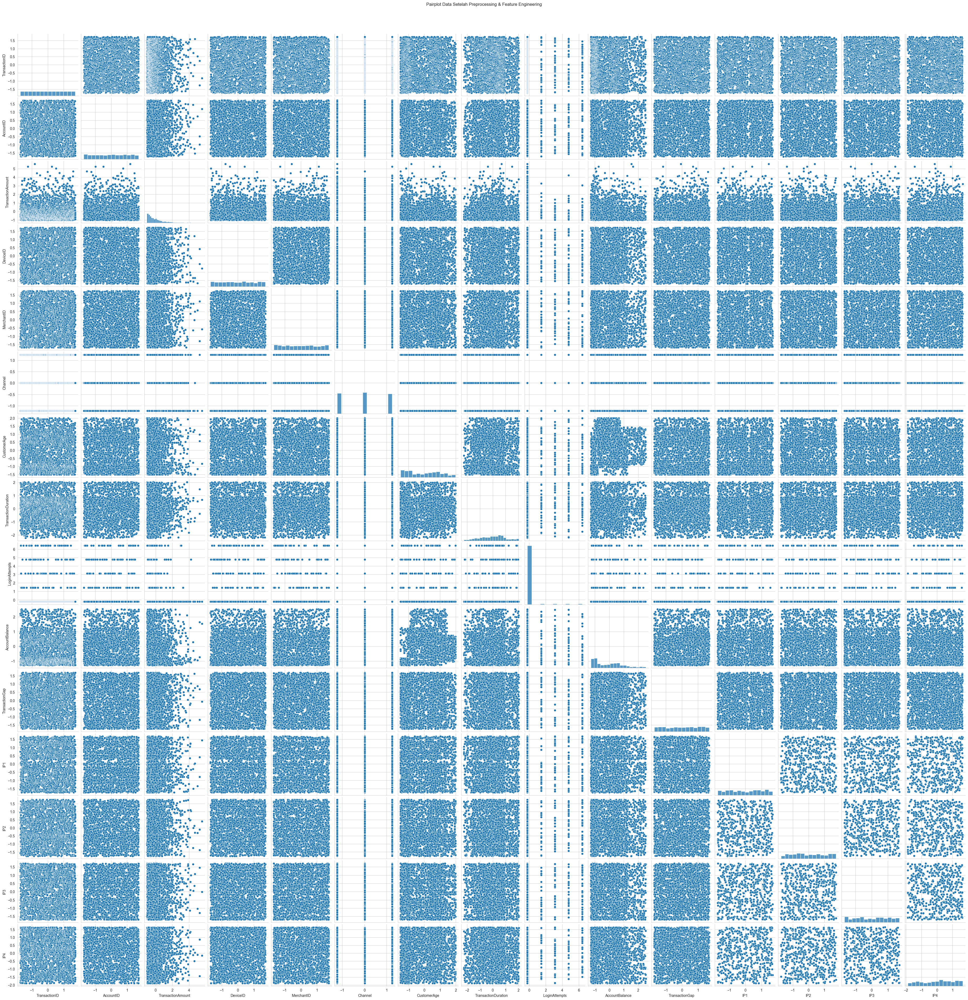

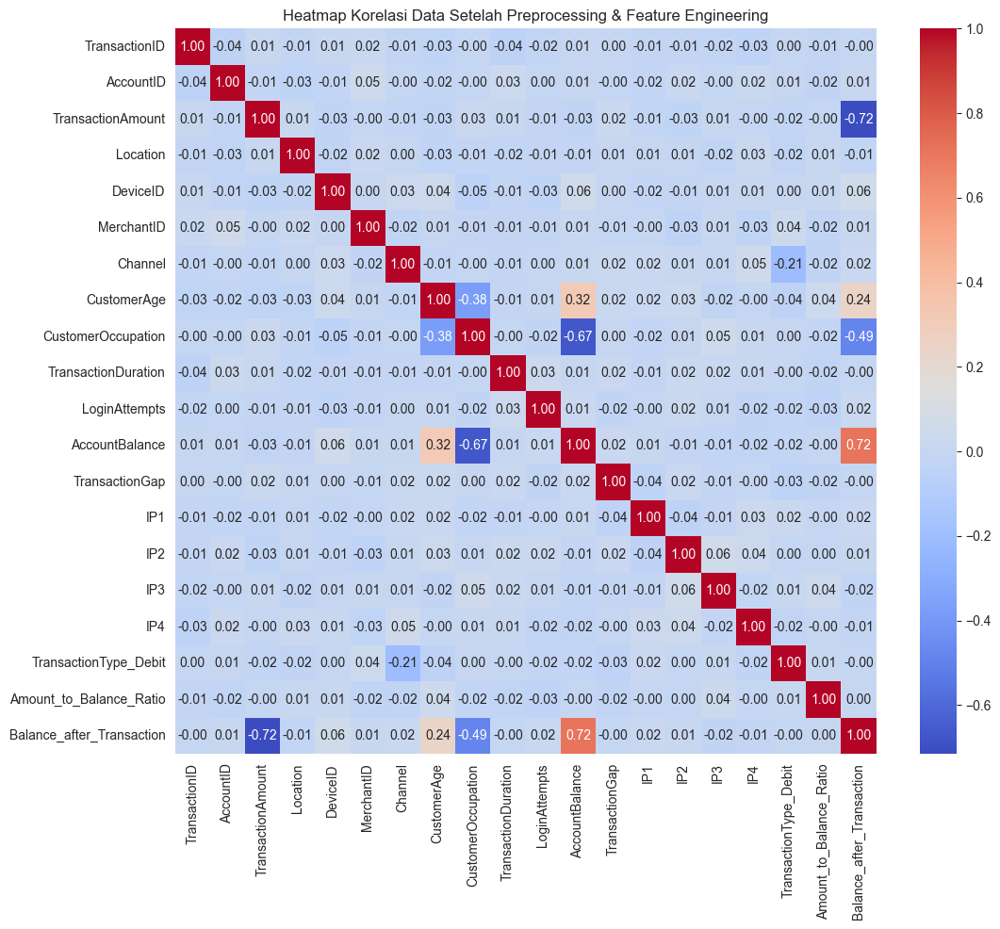

In [84]:
# --- 5. VISUALISASI PAIRPLOT & MATRIX CORRELATION ---

# Pairplot: Visualisasi hubungan antar fitur numerik (hanya contoh untuk subset fitur jika dataset besar)
sns.pairplot(data_improve[numeric_cols])
plt.suptitle('Pairplot Data Setelah Preprocessing & Feature Engineering', y=1.02)
plt.show()

# Matrix Correlation: Visualisasi korelasi antar fitur
plt.figure(figsize=(12, 10))
corr_matrix = data_improve.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Data Setelah Preprocessing & Feature Engineering')
plt.show()


In [85]:
print(data_improve.isna().sum())

TransactionID                0
AccountID                    0
TransactionAmount            0
Location                     0
DeviceID                     0
MerchantID                   0
Channel                      0
CustomerAge                  0
CustomerOccupation           0
TransactionDuration          0
LoginAttempts                0
AccountBalance               0
TransactionGap               0
IP1                          0
IP2                          0
IP3                          0
IP4                          0
TransactionType_Debit        0
Amount_to_Balance_Ratio      0
Balance_after_Transaction    0
dtype: int64


# **6. Pembangunan Model Clustering**

## **a. Pembangunan Model Clustering**

Pada tahap ini, Anda membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan. Berikut adalah **rekomendasi** tahapannya.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

In [86]:
# Inisialisasi model KMeans dengan jumlah cluster awal (misalnya 2)
kmeans = KMeans(n_clusters=2, random_state=42)

# Melatih model
kmeans.fit(data_improve)

# Menambahkan label cluster ke data
data_improve['Cluster'] = kmeans.labels_

## **b. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

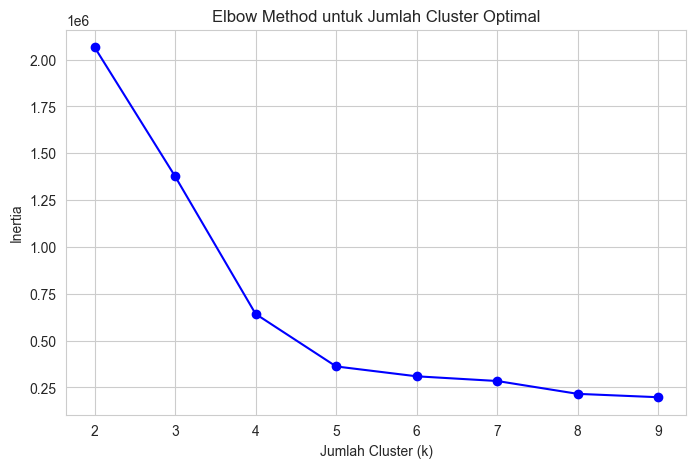

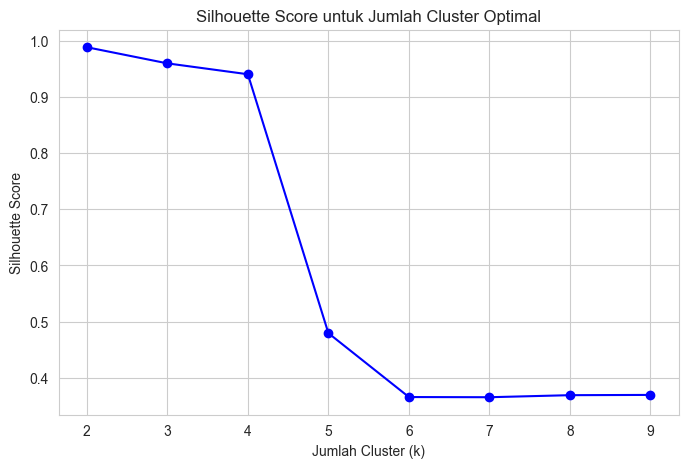

Jumlah cluster optimal: 2 dengan Silhouette Score: 0.9884840302883301


In [87]:
# Elbow Method
inertia = []
K = range(2, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_improve.drop('Cluster', axis=1, errors='ignore'))
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Jumlah Cluster (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method untuk Jumlah Cluster Optimal')
plt.show()

# Silhouette Score
silhouette_scores = []
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_improve.drop('Cluster', axis=1, errors='ignore'))
    score = silhouette_score(data_improve.drop('Cluster', axis=1, errors='ignore'), kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(8, 5))
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Jumlah Cluster (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score untuk Jumlah Cluster Optimal')
plt.show()

# Memilih jumlah cluster optimal berdasarkan silhouette score tertinggi (>= 0.70)
optimal_k = K[np.argmax(silhouette_scores)]
print(f"Jumlah cluster optimal: {optimal_k} dengan Silhouette Score: {max(silhouette_scores)}")

# Melatih ulang model dengan k optimal
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_optimal.fit(data_improve.drop('Cluster', axis=1))
data_improve['Cluster'] = kmeans_optimal.labels_

## **c. Feature Selection (Opsional)**

Silakan lakukan feature selection jika Anda membutuhkan optimasi model clustering. Jika Anda menerapkan proses ini, silakan lakukan pemodelan dan evaluasi kembali menggunakan kolom-kolom hasil feature selection. Terakhir, bandingkan hasil performa model sebelum dan sesudah menerapkan feature selection.

In [88]:
# --- 6. SELEKSI FITUR DENGAN VARIANCETHRESHOLD (Alternatif untuk Feature Agglomeration) ---

# Misalkan data_improve sudah diproses, lalu kita pilih fitur dengan VarianceThreshold
# Hapus kolom-kolom yang tidak diperlukan untuk analisis beserta kolom 'Cluster'
data_for_fs = data_improve.copy().drop([
    'Location',
    'Amount_to_Balance_Ratio',
    'TransactionID',
    'AccountID',
    'Cluster'
    ], axis=1, errors='ignore')
print("\nInitial features untuk seleksi fitur:", data_for_fs.columns.tolist())

# Kita coba beberapa nilai threshold untuk VarianceThreshold
vt_threshold_candidates = np.linspace(0, 0.1, 11)
best_vt_threshold = None
best_vt_score = -1
vt_results = {}

for thresh in vt_threshold_candidates:
    vt = VarianceThreshold(threshold=thresh)
    data_vt_temp = vt.fit_transform(data_for_fs)
    if data_vt_temp.shape[1] == 0:
        continue  # lewati jika tidak ada fitur yang tersisa
    # Reduksi dimensi dengan PCA (menyimpan 95% variansi)
    pca_tune = PCA(n_components=0.95, random_state=42)
    data_pca_tune = pca_tune.fit_transform(data_vt_temp)
    
    best_score_for_this_vt = -1
    best_k_for_this_vt = None
    for k in range(2, 15):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data_pca_tune)
        score = silhouette_score(data_pca_tune, labels)
        if score > best_score_for_this_vt:
            best_score_for_this_vt = score
            best_k_for_this_vt = k
    vt_results[thresh] = (best_k_for_this_vt, best_score_for_this_vt)
    print(f"VarianceThreshold dengan threshold {thresh:.3f} -> Best k: {best_k_for_this_vt}, Silhouette Score: {best_score_for_this_vt:.4f}")
    
    if best_score_for_this_vt > best_vt_score:
        best_vt_score = best_score_for_this_vt
        best_vt_threshold = thresh

print(f"\nBest VarianceThreshold: {best_vt_threshold:.3f} (dengan best k = {vt_results[best_vt_threshold][0]}) dan Silhouette Score: {best_vt_score:.4f}")

# --- Proses akhir dengan best VarianceThreshold ---
vt_final = VarianceThreshold(threshold=best_vt_threshold)
data_vt = vt_final.fit_transform(data_for_fs)
selected_features = data_for_fs.columns[vt_final.get_support()]
print("\nFitur yang terpilih:")
print(selected_features.tolist())

pca_tune = PCA(n_components=0.95, random_state=42)
data_pca_tune = pca_tune.fit_transform(data_vt)
print(f"\nReduced dimensions after PCA: {data_pca_tune.shape[1]}")

best_k = vt_results[best_vt_threshold][0]
final_model = KMeans(n_clusters=best_k, random_state=42)
final_labels = final_model.fit_predict(data_pca_tune)
final_score = silhouette_score(data_pca_tune, final_labels)
print(f"\nFinal silhouette score dengan best VarianceThreshold dan k = {best_k}: {final_score:.4f}")


Initial features untuk seleksi fitur: ['TransactionAmount', 'DeviceID', 'MerchantID', 'Channel', 'CustomerAge', 'CustomerOccupation', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'TransactionGap', 'IP1', 'IP2', 'IP3', 'IP4', 'TransactionType_Debit', 'Balance_after_Transaction']
VarianceThreshold dengan threshold 0.000 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.010 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.020 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.030 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.040 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.050 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.060 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.070 -> Best k: 2, Silhouette Score: 0.1380
VarianceThreshold dengan threshold 0.080 -> Best k: 2, Silhouette S

## **d. Visualisasi Hasil Clustering**

Setelah model clustering dilatih dan jumlah cluster optimal ditentukan, langkah selanjutnya adalah menampilkan hasil clustering melalui visualisasi.

Berikut adalah **rekomendasi** tahapannya.
1. Tampilkan hasil clustering dalam bentuk visualisasi, seperti grafik scatter plot atau 2D PCA projection.

Jumlah data per cluster:
Cluster
0    1397
1    1115
Name: count, dtype: int64
Jumlah cluster unik: 2


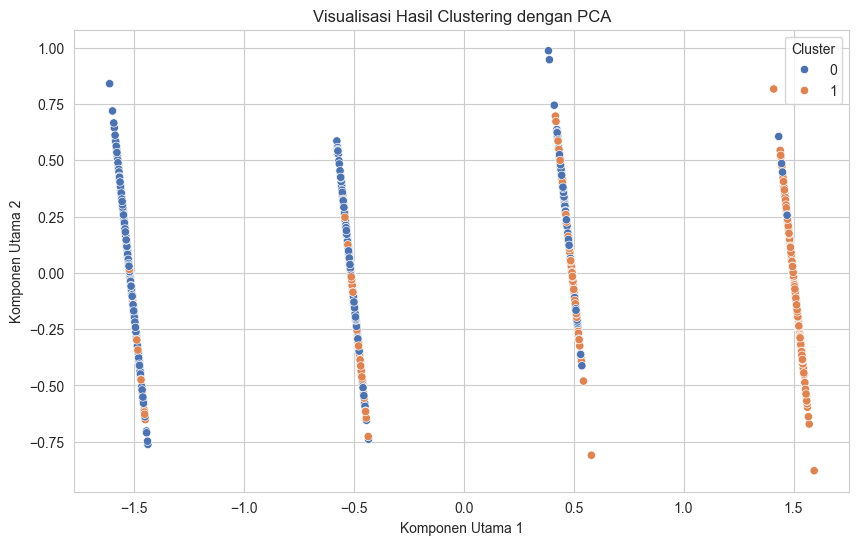

In [89]:
# --- Visualisasi Hasil Clustering ---

# Buat DataFrame dari hasil Feature Agglomeration (data_reduced)
df_reduced = pd.DataFrame(data_fa, columns=[f'agg_feature_{i}' for i in range(data_fa.shape[1])])
df_reduced['Cluster'] = final_labels

# Cetak jumlah data per cluster
print("Jumlah data per cluster:")
print(df_reduced['Cluster'].value_counts())

# Jika ingin mencetak jumlah cluster unik
print("Jumlah cluster unik:", df_reduced['Cluster'].nunique())

# Untuk visualisasi, kita lakukan PCA pada data_reduced (tanpa kolom 'Cluster') dengan n_components=2
pca_vis = PCA(n_components=2)
data_vis = pca_vis.fit_transform(df_reduced.drop('Cluster', axis=1))
df_vis = pd.DataFrame(data_vis, columns=['PC1', 'PC2'])
df_vis['Cluster'] = df_reduced['Cluster']

# Visualisasikan hasil clustering dengan scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=df_vis, palette='deep')
plt.title('Visualisasi Hasil Clustering dengan PCA')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.legend(title='Cluster')
plt.show()


## **e. Analisis dan Interpretasi Hasil Cluster**

### Interpretasi Target

**Tutorial: Melakukan Inverse Transform pada Data Target Setelah Clustering**

Setelah melakukan clustering dengan model **KMeans**, kita perlu mengembalikan data yang telah diubah (normalisasi, standarisasi, atau label encoding) ke bentuk aslinya. Berikut adalah langkah-langkahnya.

---

**1. Tambahkan Hasil Label Cluster ke DataFrame**
Setelah mendapatkan hasil clustering, kita tambahkan label cluster ke dalam DataFrame yang telah dinormalisasi.

```python
df_normalized['Cluster'] = model_kmeans.labels_
```

Lakukan Inverse Transform pada feature yang sudah dilakukan Labelisasi dan Standararisasi. Berikut code untuk melakukannya:
label_encoder.inverse_transform(X_Selected[['Fitur']])

Lalu masukkan ke dalam kolom dataset asli atau membuat dataframe baru
```python
df_normalized['Fitur'] = label_encoder.inverse_transform(df_normalized[['Fitur']])
```
Masukkan Data yang Sudah Di-Inverse ke dalam Dataset Asli atau Buat DataFrame Baru
```python
df_original['Fitur'] = df_normalized['Fitur']
```

### Inverse Data Jika Melakukan Normalisasi/Standardisasi

Inverse Transform untuk Data yang Distandarisasi
Jika data numerik telah dinormalisasi menggunakan StandardScaler atau MinMaxScaler, kita bisa mengembalikannya ke skala asli:
```python
df_normalized[['Fitur_Numerik']] = scaler.inverse_transform(df_normalized[['Fitur_Numerik']])
```

In [90]:
# Type your code here

Setelah melakukan clustering, langkah selanjutnya adalah menganalisis karakteristik dari masing-masing cluster berdasarkan fitur yang tersedia.

Berikut adalah **rekomendasi** tahapannya.
1. Analisis karakteristik tiap cluster berdasarkan fitur yang tersedia (misalnya, distribusi nilai dalam cluster).
2. Berikan interpretasi: Apakah hasil clustering sesuai dengan ekspektasi dan logika bisnis? Apakah ada pola tertentu yang bisa dimanfaatkan?

In [91]:
# Type your code here

Tulis hasil interpretasinya di sini.
1. Cluster 1:
2. Cluster 2:
3. Cluster 3:

# Contoh interpretasi [TEMPLATE]
# Analisis Karakteristik Cluster dari Model KMeans

Berikut adalah analisis karakteristik untuk setiap cluster yang dihasilkan dari model KMeans.

## Cluster 1:
- **Rata-rata Annual Income (k$):** 48,260  
- **Rata-rata Spending Score (1-100):** 56.48  
- **Analisis:** Cluster ini mencakup pelanggan dengan pendapatan tahunan menengah dan tingkat pengeluaran yang cukup tinggi. Pelanggan dalam cluster ini cenderung memiliki daya beli yang moderat dan mereka lebih cenderung untuk membelanjakan sebagian besar pendapatan mereka.

## Cluster 2:
- **Rata-rata Annual Income (k$):** 86,540  
- **Rata-rata Spending Score (1-100):** 82.13  
- **Analisis:** Cluster ini menunjukkan pelanggan dengan pendapatan tahunan tinggi dan pengeluaran yang sangat tinggi. Pelanggan di cluster ini merupakan kelompok premium dengan daya beli yang kuat dan cenderung mengeluarkan uang dalam jumlah besar untuk produk atau layanan.

## Cluster 3:
- **Rata-rata Annual Income (k$):** 87,000  
- **Rata-rata Spending Score (1-100):** 18.63  
- **Analisis:** Cluster ini terdiri dari pelanggan dengan pendapatan tahunan yang tinggi tetapi pengeluaran yang rendah. Mereka mungkin memiliki kapasitas finansial yang baik namun tidak terlalu aktif dalam berbelanja. Ini bisa menunjukkan bahwa mereka lebih selektif dalam pengeluaran mereka atau mungkin lebih cenderung untuk menyimpan uang.

# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.